# Julia Lesson 1
## Variables, numbers and arithmetic operations


Integer (Int)

In [1]:
2

2

Floating point number (Float64)

In [2]:
2.0

2.0

Set variable x to the Int 3

In [3]:
x = 3

3

Set variable x to itself plus 2

In [4]:
x = x + 2

5

Set variable x to itself times 2

In [5]:
x = x * 2

10

## Vectors and matrices

Vector - notice the data is preceded by the type

In [6]:
v1 = [0.25, 0.25, 0.5]

3-element Array{Float64,1}:
 0.25
 0.25
 0.5 

Can also get the type with typeof

In [7]:
typeof(v1)

Array{Float64,1}

Matrix; use semicolons to separate rows and spaces to separate elements within a row

In [9]:
M = [
    0.75 0.25 0.0;
    0.25 0.5 0.25;
    0.0 0.25 0.75
    ]

3×3 Array{Float64,2}:
 0.75  0.25  0.0 
 0.25  0.5   0.25
 0.0   0.25  0.75

Matrix vector multiplication

In [9]:
M * v1

3-element Array{Float64,1}:
 0.25  
 0.3125
 0.4375

Note that this is a 1x3 matrix rather than a 3 vector, a distinction most mathematicians ignore

In [10]:
v2 = [0.25 0.25 0.5]

1×3 Array{Float64,2}:
 0.25  0.25  0.5

Matrix multiplication preserves the type

In [11]:
v2 * M

1×3 Array{Float64,2}:
 0.25  0.3125  0.4375

We can't multiply a 3x3 matrix with a 1x3 matrix:

In [12]:
M * v2

DimensionMismatch: DimensionMismatch("A has dimensions (3,3) but B has dimensions (1,3)")

Identity matrix

In [32]:
one(M)

3×3 Array{Float64,2}:
 1.0  0.0  0.0
 0.0  1.0  0.0
 0.0  0.0  1.0

Matrix subtraction

In [33]:
one(M) - M

3×3 Array{Float64,2}:
  0.25  -0.25   0.0 
 -0.25   0.5   -0.25
  0.0   -0.25   0.25

To use a package, use the builtin ```using```.<br/>
Linear algebra routines are in a package called LinearAlgebra

Matrix matrix multiplication

In [13]:
M * M

3×3 Array{Float64,2}:
 0.625   0.3125  0.0625
 0.3125  0.375   0.3125
 0.0625  0.3125  0.625 

Matrix power

In [14]:
M^2

3×3 Array{Float64,2}:
 0.625   0.3125  0.0625
 0.3125  0.375   0.3125
 0.0625  0.3125  0.625 

## Example:  Stationary Distribution

### We know how to calculate the stationary distribution 4 different ways:

First create a transition matrix

In [1]:
P = [
    0.6 0.4 0.0;
    0.2 0.5 0.3;
    0.0 0.3 0.7;
    ]

3×3 Array{Float64,2}:
 0.6  0.4  0.0
 0.2  0.5  0.3
 0.0  0.3  0.7

### We can calculate the stationary distribution by taking ```P``` to a high power

In [32]:
P^1000

3×3 Array{Float64,2}:
 0.2  0.4  0.4
 0.2  0.4  0.4
 0.2  0.4  0.4

### We can calculate the stationary distribution using the Markov chain tree theorem.<br/>
Note that ```Array``` indices start with $1$.<br/>
Multiple expressions on a line can be separated by ```;```

In [44]:
dd = P[2,1]*P[3,2]; ud = P[1,2]*P[3,2]; uu = P[1,2]*P[2,3]

0.12

In [45]:
[dd, ud, uu]/(dd + ud + uu)

3-element Array{Float64,1}:
 0.2
 0.4
 0.4

### We can calculate the stationary distribution by solving equations.<br/>

In [60]:
M = P - one(P)

3×3 Array{Float64,2}:
 -0.4   0.4   0.0
  0.2  -0.5   0.3
  0.0   0.3  -0.3

The special symbol ```:``` can be used to represent all elements of an ```Array```.<br/>
```ones``` (not to be confused with ```one``` above) creates a vector of all $1$'s

In [61]:
M[:,3] = ones(3)

3-element Array{Float64,1}:
 1.0
 1.0
 1.0

The stationary distribution is the inverse of the matrix above left multiplied by ```[0 0 1]```.<br/>
```inv``` takes the inverse of a matrix

In [63]:
[0 0 1]*inv(M)

1×3 Array{Float64,2}:
 0.2  0.4  0.4

### We can also calculate the stationary distribution using eigenvalues and eigenvectors

The builtin ```using``` allows one to use packages.<br/>
Linear algebra routines are in the package LinearAlgebra

In [29]:
using LinearAlgebra

```eigen``` returns the pair of eigenvalues and eigenvectors.<br/>
The pair can be deconstructed by assigning it to a pair of variables

In [3]:
(eigenvalues, eigenvectors) = eigen(P)

Eigen{Float64,Float64,Array{Float64,2},Array{Float64,1}}
eigenvalues:
3-element Array{Float64,1}:
 0.15505102572168217
 0.6449489742783178 
 1.0                
eigenvectors:
3×3 Array{Float64,2}:
  0.618703   0.848914   0.57735
 -0.688229   0.0953945  0.57735
  0.378877  -0.519851   0.57735

Are these right or left eigenvectors?<br/>
Create a diagonal matrix from a vector

In [27]:
Diagonal(eigenvalues)

3×3 Diagonal{Float64,Array{Float64,1}}:
 0.25   ⋅     ⋅ 
  ⋅    0.75   ⋅ 
  ⋅     ⋅    1.0

Try to reconstruct the matrix assuming they are right eigenvectors

In [34]:
inv(eigenvectors) * Diagonal( eigenvalues ) * eigenvectors

3×3 Array{Float64,2}:
  0.59202    -0.245589  -0.0121597
 -0.310447    0.51899   -0.354272 
 -0.0117988  -0.271942   0.68899  

Not left eigenvectors!

In [35]:
eigenvectors * Diagonal( eigenvalues ) * inv(eigenvectors)

3×3 Array{Float64,2}:
  0.6          0.4  -1.11022e-16
  0.2          0.5   0.3        
 -5.55112e-17  0.3   0.7        

We can get the right eigenvectors by inverting the matrix of left eigenvectors

In [37]:
inv(eigenvectors)

3×3 Array{Float64,2}:
 0.382575  -0.851133   0.468557
 0.663553   0.14913   -0.812683
 0.34641    0.69282    0.69282 

The last row is the stationary distribution after normalization.<br/>
Note that indexing by the special symbol ```end``` gives the last element and indexing by ```:``` gives all elements of an ```Array```

In [41]:
pi = inv(eigenvectors)[end,:]

3-element Array{Float64,1}:
 0.34641016151377546
 0.692820323027551  
 0.6928203230275508 

Now normalize.<br/>
```sum``` sums the elements of an ```Array```

In [42]:
pi/sum(pi)

3-element Array{Float64,1}:
 0.2                
 0.4000000000000001 
 0.39999999999999997

```abs``` is absolute values and ```.``` makes any function work on a vector

In [5]:
abs.(eigenvalues)

3-element Array{Float64,1}:
 0.15505102572168217
 0.6449489742783178 
 1.0                

The index of the highest magnitude eigenvalue can be found with ```argmax```

In [4]:
argmax(eigenvalues)

3

This can be used to find the stationary distribution automatically

In [7]:
pi = inv(eigenvectors)[argmax(eigenvalues),:]

3-element Array{Float64,1}:
 0.34641016151377546
 0.692820323027551  
 0.6928203230275508 

In [8]:
pi/sum(pi)

3-element Array{Float64,1}:
 0.2                
 0.4000000000000001 
 0.39999999999999997

## Periodic Markov chain

In [23]:
GCD3 = [
    0 1 0 0 0 0;
    0 0 1 0 0 0;
    1/2 0 0 1/2 0 0;
    0 0 0 0 1 0;
    0 0 0 0 0 1;
    1 0 0 0 0 0;
]

6×6 Array{Float64,2}:
 0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.0  0.0  0.0
 0.5  0.0  0.0  0.5  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0
 1.0  0.0  0.0  0.0  0.0  0.0

In [31]:
(eigenvalues,eigenvectors) = eigen(GCD3)

Eigen{Complex{Float64},Complex{Float64},Array{Complex{Float64},2},Array{Complex{Float64},1}}
eigenvalues:
6-element Array{Complex{Float64},1}:
 -0.5000000000000002 + 0.8660254037844389im
 -0.5000000000000002 - 0.8660254037844389im
  1.0000000000000007 + 0.0im               
 -0.7937005259841006 + 0.0im               
 0.39685026299205006 + 0.6873648184993015im
 0.39685026299205006 - 0.6873648184993015im
eigenvectors:
6×6 Array{Complex{Float64},2}:
 -0.204124+0.353553im   -0.204124-0.353553im   …  -0.314129-1.38778e-17im
 -0.204124-0.353553im   -0.204124+0.353553im      -0.124662+0.215921im   
  0.408248+0.0im         0.408248-0.0im           0.0989445+0.171377im   
 -0.204124+0.353553im   -0.204124-0.353553im       0.628259-0.0im        
 -0.204124-0.353553im   -0.204124+0.353553im       0.249325-0.431843im   
  0.408248+4.996e-16im   0.408248-4.996e-16im  …  -0.197889-0.342754im   

In [17]:
abs.(eigenvalues)

6-element Array{Float64,1}:
 1.0000000000000004
 1.0000000000000004
 1.0000000000000007
 0.7937005259841006
 0.7937005259841001
 0.7937005259841001

We're going to generate a random initial distribution.<br/>
This can be done with ```rand``` which generates an IID uniform $[0,1]$ random vector

In [10]:
rand(6)

6-element Array{Float64,1}:
 0.23603334566204692
 0.34651701419196046
 0.3127069683360675 
 0.00790928339056074
 0.4886128300795012 
 0.21096820215853596

However, this isn't repeatable, an important aspect of software development

In [11]:
rand(6)

6-element Array{Float64,1}:
 0.951916339835734  
 0.9999046588986136 
 0.25166218303197185
 0.9866663668987996 
 0.5557510873245723 
 0.43710797460962514

In order to make it repeatable, we will explicitly seed the random number generators.<br/>
This can be done with a function from the package ```Random```

In [12]:
using Random

The function is ```seed!``` but it is not exported from the ```Random``` package.<br/>
Functions which are not exported from a package can be called using the notation ```Random.seed!```

In [13]:
Random.seed!(1)

MersenneTwister(UInt32[0x00000001], Random.DSFMT.DSFMT_state(Int32[1749029653, 1072851681, 1610647787, 1072862326, 1841712345, 1073426746, -198061126, 1073322060, -156153802, 1073567984  …  1977574422, 1073209915, 278919868, 1072835605, 1290372147, 18858467, 1815133874, -1716870370, 382, 0]), [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], UInt128[0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000  …  0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x000000000000

In [14]:
pi0 = rand(6)

6-element Array{Float64,1}:
 0.23603334566204692
 0.34651701419196046
 0.3127069683360675 
 0.00790928339056074
 0.4886128300795012 
 0.21096820215853596

In [19]:
Random.seed!(1)
pi0 = rand(6)

6-element Array{Float64,1}:
 0.23603334566204692
 0.34651701419196046
 0.3127069683360675 
 0.00790928339056074
 0.4886128300795012 
 0.21096820215853596

In [20]:
pi0 = pi0/sum(pi0)

6-element Array{Float64,1}:
 0.14726794113368893  
 0.21620185531289027  
 0.19510680270976313  
 0.0049348276511679955
 0.30485949049055694  
 0.13162908270193277  

We'll now see what happens to this distribution after each step of the Markov chain.<br/>
First we'll make an array to put the results in.<br/>
We'll fill the array with ```NaN``` which is the IEEE floating point standard representation of "not a number".<br/>
We'll run for 100 steps so we create a 100x6 array with ```fill```

In [18]:
pin = fill(NaN, 100, 6)

100×6 Array{Float64,2}:
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
   ⋮                        ⋮
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN
 NaN  NaN  NaN  NaN  NaN  NaN

Now we'll use a ```for``` loop to calculate the step by step distributions of the Markov chain

In [25]:
pin[1,:] = pi0
for i = 1:99
    pin[i+1,:] = pin[i,:]' * GCD3
end
pin

100×6 Array{Float64,2}:
 0.147268   0.216202   0.195107   0.00493483  0.304859    0.131629  
 0.229182   0.147268   0.216202   0.0975534   0.00493483  0.304859  
 0.41296    0.229182   0.147268   0.108101    0.0975534   0.00493483
 0.0785688  0.41296    0.229182   0.073634    0.108101    0.0975534 
 0.212145   0.0785688  0.41296    0.114591    0.073634    0.108101  
 0.314581   0.212145   0.0785688  0.20648     0.114591    0.073634  
 0.112918   0.314581   0.212145   0.0392844   0.20648     0.114591  
 0.220664   0.112918   0.314581   0.106072    0.0392844   0.20648   
 0.363771   0.220664   0.112918   0.157291    0.106072    0.0392844 
 0.0957436  0.363771   0.220664   0.0564592   0.157291    0.106072  
 0.216404   0.0957436  0.363771   0.110332    0.0564592   0.157291  
 0.339176   0.216404   0.0957436  0.181885    0.110332    0.0564592 
 0.104331   0.339176   0.216404   0.0478718   0.181885    0.110332  
 ⋮                                                        ⋮         
 0.217824 

A more concise approach is to use a list comprehension

In [26]:
[pi0'*GCD3^i for i in 0:99]

100-element Array{LinearAlgebra.Adjoint{Float64,Array{Float64,1}},1}:
 [0.147268 0.216202 … 0.304859 0.131629]  
 [0.229182 0.147268 … 0.00493483 0.304859]
 [0.41296 0.229182 … 0.0975534 0.00493483]
 [0.0785688 0.41296 … 0.108101 0.0975534] 
 [0.212145 0.0785688 … 0.073634 0.108101] 
 [0.314581 0.212145 … 0.114591 0.073634]  
 [0.112918 0.314581 … 0.20648 0.114591]   
 [0.220664 0.112918 … 0.0392844 0.20648]  
 [0.363771 0.220664 … 0.106072 0.0392844] 
 [0.0957436 0.363771 … 0.157291 0.106072] 
 [0.216404 0.0957436 … 0.0564592 0.157291]
 [0.339176 0.216404 … 0.110332 0.0564592] 
 [0.104331 0.339176 … 0.181885 0.110332]  
 ⋮                                        
 [0.217824 0.101469 … 0.0507343 0.173687] 
 [0.347374 0.217824 … 0.108912 0.0507343] 
 [0.101469 0.347374 … 0.173687 0.108912]  
 [0.217824 0.101469 … 0.0507343 0.173687] 
 [0.347374 0.217824 … 0.108912 0.0507343] 
 [0.101469 0.347374 … 0.173687 0.108912]  
 [0.217824 0.101469 … 0.0507343 0.173687] 
 [0.347374 0.217824 … 0.108

Let's plot the first coordinate.<br/>
The function ```plot``` from the package ```Plots``` can do this

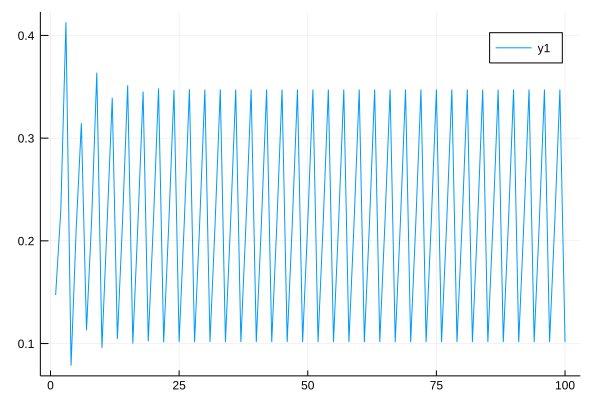

In [47]:
using Plots
plot(pin[:,1])

Now let's look at the stationary distribution.<br/>
Notice that it has small imaginary parts due to numerical inaccuracies.<br/>
Also, the chain did not converge to the stationary distribution

In [32]:
pi=inv(eigenvectors)[3,:]
pi/sum(pi)

6-element Array{Complex{Float64},1}:
  0.2222222222222223 - 3.789689817689569e-17im 
  0.2222222222222225 - 3.903399289132732e-18im 
 0.22222222222222215 + 2.627921424542505e-17im 
 0.11111111111111108 + 3.8675784059013625e-17im
 0.11111111111111113 + 1.2790497693919075e-17im
  0.1111111111111111 - 3.5945198532329326e-17im

Let's look at the mean of the last $3$ steps.<br/>
The ```mean``` function is in the ```StatsBase``` package

In [45]:
using StatsBase
[StatsBase.mean(pin[end-2:end,i]) for i in 1:6]

6-element Array{Float64,1}:
 0.22222222222641674
 0.22222222223174848
 0.222222222216478  
 0.11111111110691668
 0.11111111110158493
 0.11111111111685541